### Import packages

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [ ]:
import warnings
warnings.filterwarnings('ignore')

#### Since the same dataset is used as for some of the the previous homework (as in resgression and classification task), I used something that I did in the last homeworks (EDA and FE part):

<div class="alert-success">
<h2 style="padding:50px"> Regression task </h2>
</div>

#### Data loading

In [ ]:
#reading dataframe
data = pd.read_csv('AirQualityUCI.csv', sep = ',')

In [ ]:
data.head()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Unnamed: 15,Unnamed: 16
0,3/10/2004,18:00:00,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578,NaN,NaN
1,3/10/2004,19:00:00,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255,NaN,NaN
2,3/10/2004,20:00:00,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502,NaN,NaN
3,3/10/2004,21:00:00,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867,NaN,NaN
4,3/10/2004,22:00:00,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888,NaN,NaN


In [ ]:
data.shape

(9471, 17)

From here we can see that dataframe has 9471 rows and 17 columns (features).

In [ ]:
#Formatting Date and Time to datetime type
data['Time'] = pd.to_datetime(data['Time'],format= '%H:%M:%S' ).dt.time
data['Time']=data['Time'].astype(str)

In [ ]:
#converting date and time to datetime
data['Datetime']=data.Date+' '+data.Time
data['Time']=pd.to_datetime(data.Datetime)
data.dtypes

Date                     object
Time             datetime64[ns]
CO(GT)                  float64
PT08.S1(CO)             float64
NMHC(GT)                float64
C6H6(GT)                float64
PT08.S2(NMHC)           float64
NOx(GT)                 float64
PT08.S3(NOx)            float64
NO2(GT)                 float64
PT08.S4(NO2)            float64
PT08.S5(O3)             float64
T                       float64
RH                      float64
AH                      float64
Unnamed: 15             float64
Unnamed: 16             float64
Datetime                 object
dtype: object

In [ ]:
#removing features date and datetime
data.drop('Date', axis=1, inplace=True)
data.drop('Datetime', axis=1, inplace=True)

Formatting some object columns from strings to floats (columns: CO(GT), C6H6(GT), T, RH, AH).

In [ ]:
data.replace(to_replace=',',value='.',regex=True,inplace=True)

for i in 'CO(GT) C6H6(GT) T RH AH'.split():
    data[i] = pd.to_numeric(data[i],errors='coerce')

Replacing null data from -200 to NaN for posterior treatment.

In [ ]:
data.replace(to_replace=-200,value=np.nan,inplace=True)

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9471 entries, 0 to 9470
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Time           9357 non-null   datetime64[ns]
 1   CO(GT)         7674 non-null   float64       
 2   PT08.S1(CO)    8991 non-null   float64       
 3   NMHC(GT)       914 non-null    float64       
 4   C6H6(GT)       8991 non-null   float64       
 5   PT08.S2(NMHC)  8991 non-null   float64       
 6   NOx(GT)        7718 non-null   float64       
 7   PT08.S3(NOx)   8991 non-null   float64       
 8   NO2(GT)        7715 non-null   float64       
 9   PT08.S4(NO2)   8991 non-null   float64       
 10  PT08.S5(O3)    8991 non-null   float64       
 11  T              8991 non-null   float64       
 12  RH             8991 non-null   float64       
 13  AH             8991 non-null   float64       
 14  Unnamed: 15    0 non-null      float64       
 15  Unnamed: 16    0 non-

I will check the number of missing values in the dataset.

In [ ]:
data.isnull().sum()

Time              114
CO(GT)           1797
PT08.S1(CO)       480
NMHC(GT)         8557
C6H6(GT)          480
PT08.S2(NMHC)     480
NOx(GT)          1753
PT08.S3(NOx)      480
NO2(GT)          1756
PT08.S4(NO2)      480
PT08.S5(O3)       480
T                 480
RH                480
AH                480
Unnamed: 15      9471
Unnamed: 16      9471
dtype: int64

The column NMHC (GT) seems to have a lot of misplaced data; unnamed:15 and unnamed: 16 have all missing values, so I decided to drop these features. Also I will drop all duplicates.

In [ ]:
data.drop('NMHC(GT)', axis=1, inplace=True)
data.drop(['Unnamed: 15','Unnamed: 16'], axis = 1, inplace = True)
data.drop_duplicates(inplace= True)
data.head()

,Time,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,2004-03-10 18:00:00,2.6,1360.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,2004-03-10 19:00:00,2.0,1292.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,2004-03-10 20:00:00,2.2,1402.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,2004-03-10 21:00:00,2.2,1376.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,2004-03-10 22:00:00,1.6,1272.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888


Below, I choose to fill in the missing values using the median_filling function, which fills in the missing values with median using group by "Time" feature.

In [ ]:
def median_filling(col):
    data[col] = data.groupby('Time')[col].transform(lambda x:x.fillna(x.median()))

In [ ]:
#filing empty cells with the median
col_list = data.columns[1:12]

for i in col_list:
    median_filling(i)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9358 entries, 0 to 9357
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Time           9357 non-null   datetime64[ns]
 1   CO(GT)         7674 non-null   float64       
 2   PT08.S1(CO)    8991 non-null   float64       
 3   C6H6(GT)       8991 non-null   float64       
 4   PT08.S2(NMHC)  8991 non-null   float64       
 5   NOx(GT)        7718 non-null   float64       
 6   PT08.S3(NOx)   8991 non-null   float64       
 7   NO2(GT)        7715 non-null   float64       
 8   PT08.S4(NO2)   8991 non-null   float64       
 9   PT08.S5(O3)    8991 non-null   float64       
 10  T              8991 non-null   float64       
 11  RH             8991 non-null   float64       
 12  AH             8991 non-null   float64       
dtypes: datetime64[ns](1), float64(12)
memory usage: 1023.5 KB


From here we can see that there are still missing values, so I choose to use the ffill method - replace values with the value from the previous row.

In [ ]:
data.fillna(method='ffill', inplace= True)

In [ ]:
data.isnull().sum()

Time             0
CO(GT)           0
PT08.S1(CO)      0
C6H6(GT)         0
PT08.S2(NMHC)    0
NOx(GT)          0
PT08.S3(NOx)     0
NO2(GT)          0
PT08.S4(NO2)     0
PT08.S5(O3)      0
T                0
RH               0
AH               0
dtype: int64

I checked if there were any missing values ​​- there are no missing values.

#### Dealing with ouliers

In [ ]:
data.describe()

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
count,9358.000000,9358.000000,9358.000000,9358.000000,9358.000000,9358.000000,9358.000000,9358.000000,9358.000000,9358.000000,9358.000000,9358.000000
mean,2.082208,1102.726972,10.190575,942.559414,240.733811,832.723125,109.421137,1452.979910,1030.488993,18.318444,48.813614,1.017327
std,1.469723,219.576612,7.565388,269.569125,206.607564,255.702434,47.223022,347.431664,410.900784,8.822040,17.357326,0.404842
min,0.100000,647.000000,0.100000,383.000000,2.000000,322.000000,2.000000,551.000000,221.000000,-1.900000,9.200000,0.184700
25%,1.000000,938.250000,4.400000,733.000000,97.000000,654.250000,73.000000,1227.250000,726.000000,11.900000,35.400000,0.726200
50%,1.700000,1062.000000,8.300000,911.000000,174.000000,807.000000,102.000000,1460.000000,964.000000,17.600000,48.900000,0.987500
75%,2.800000,1237.000000,14.000000,1117.000000,318.000000,967.750000,137.000000,1677.000000,1286.750000,24.300000,61.900000,1.306700
max,11.900000,2040.000000,63.700000,2214.000000,1479.000000,2683.000000,340.000000,2775.000000,2523.000000,44.600000,88.700000,2.231000


When I compare the mean and median using this table, I don't see that any attribute has any huge outliers. But, we will see better using next graphs. First I will split continuous columns.

In [ ]:
continuous_columns = []
for column_name in data.columns:
    if data[column_name].dtype == float:
        continuous_columns.append(column_name)

In [ ]:
continuous_columns

['CO(GT)',
 'PT08.S1(CO)',
 'C6H6(GT)',
 'PT08.S2(NMHC)',
 'NOx(GT)',
 'PT08.S3(NOx)',
 'NO2(GT)',
 'PT08.S4(NO2)',
 'PT08.S5(O3)',
 'T',
 'RH',
 'AH']

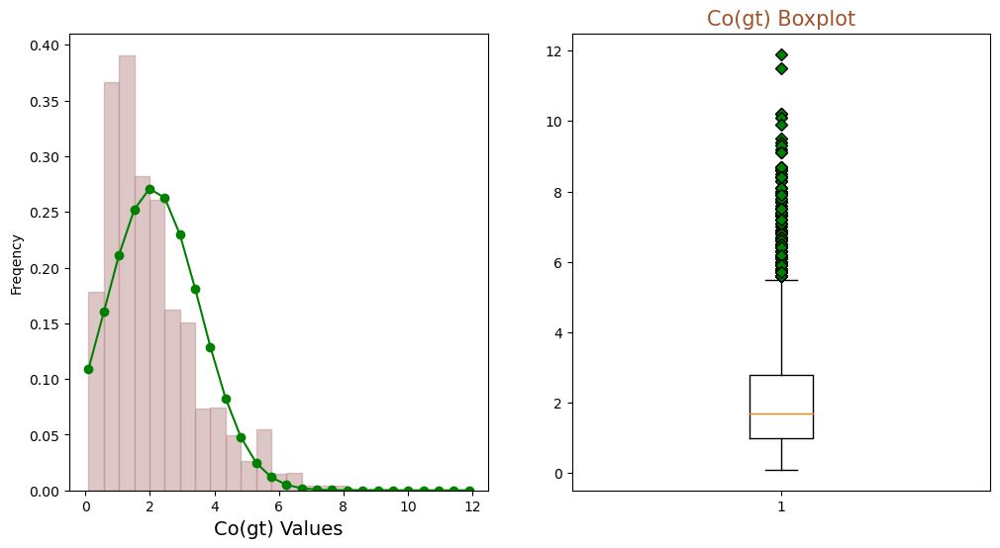

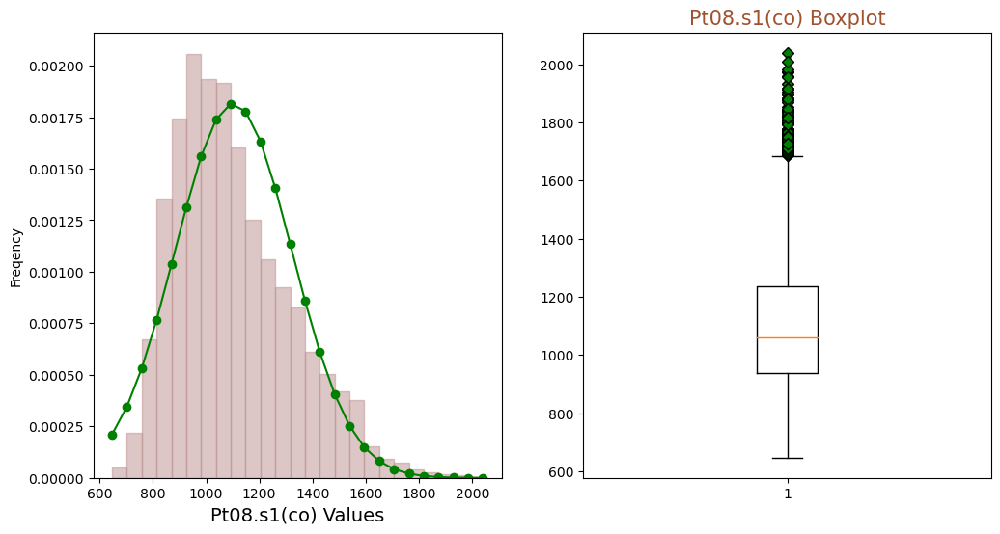

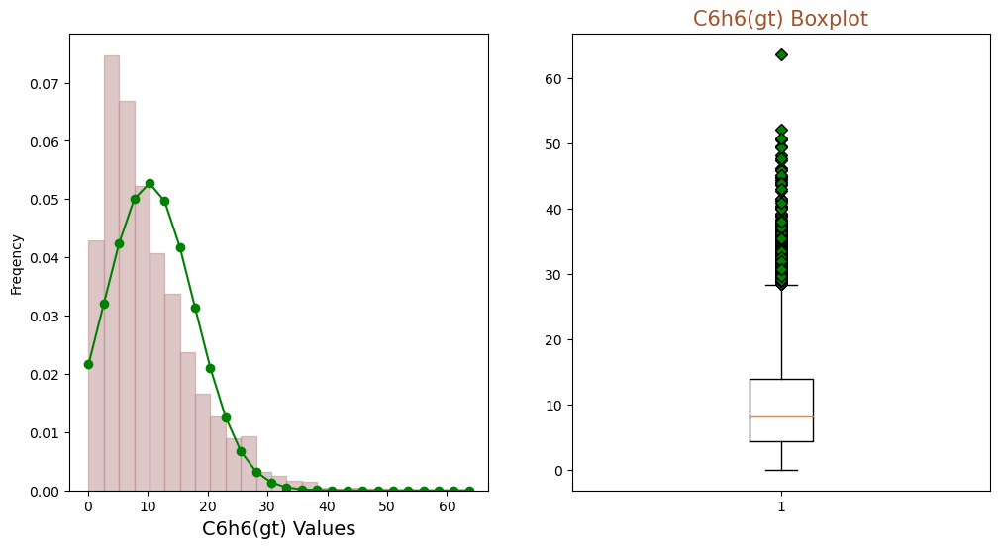

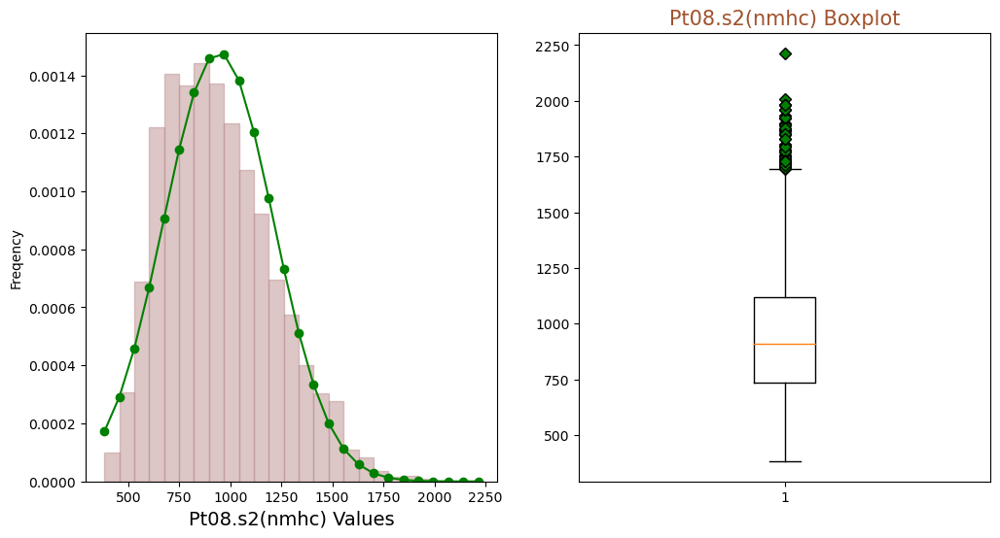

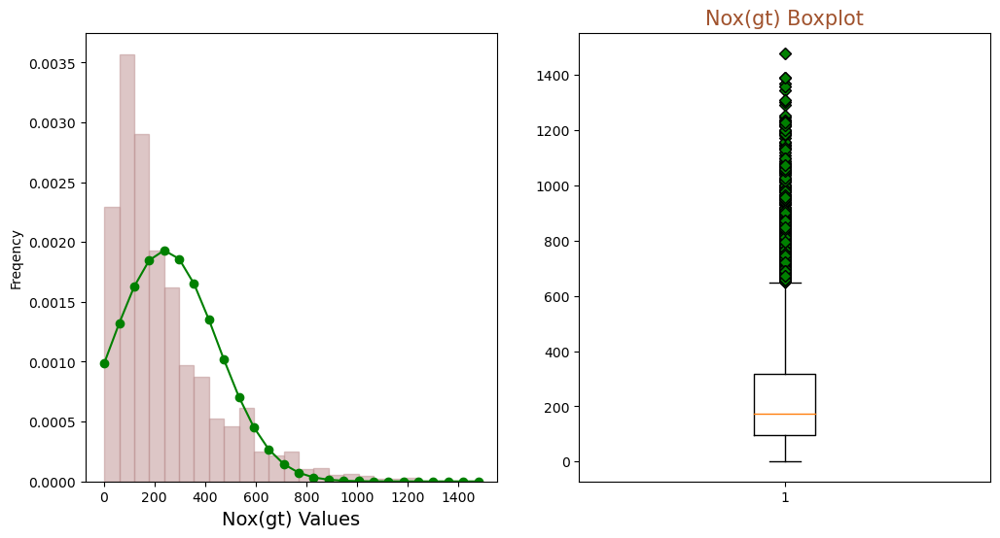

...

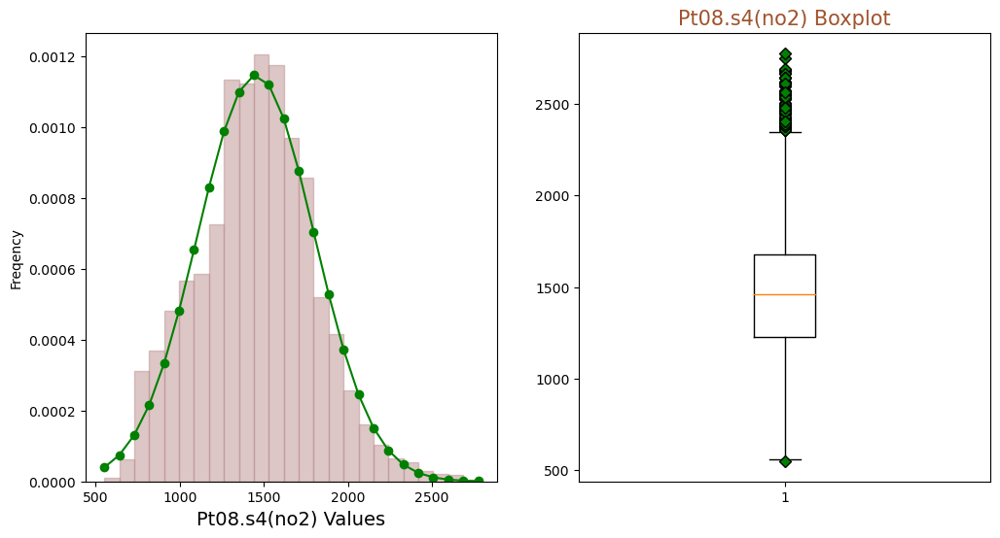

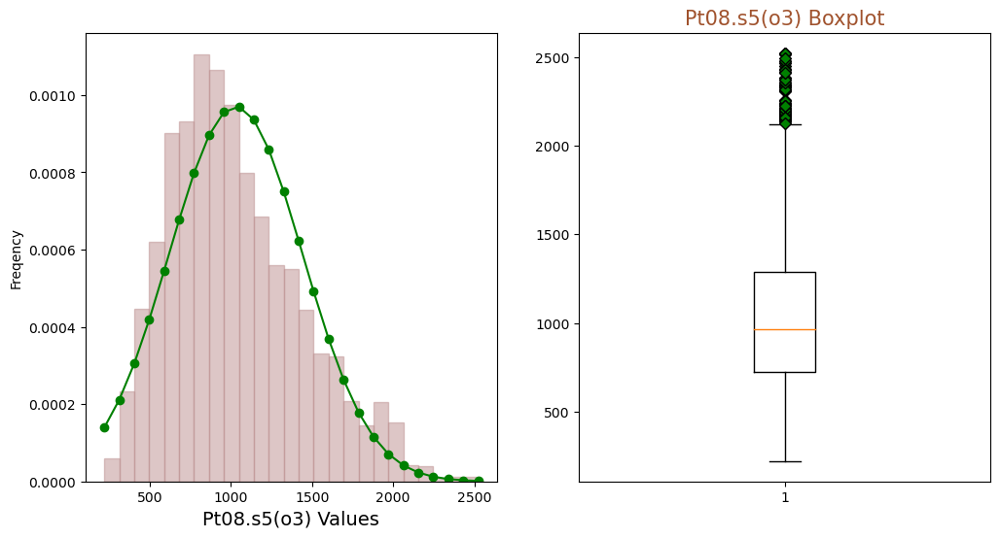

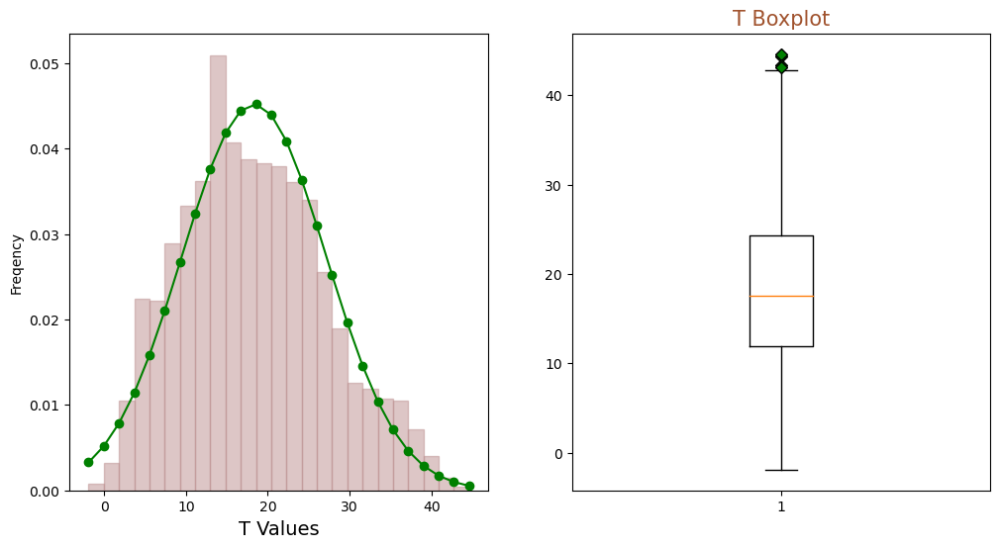

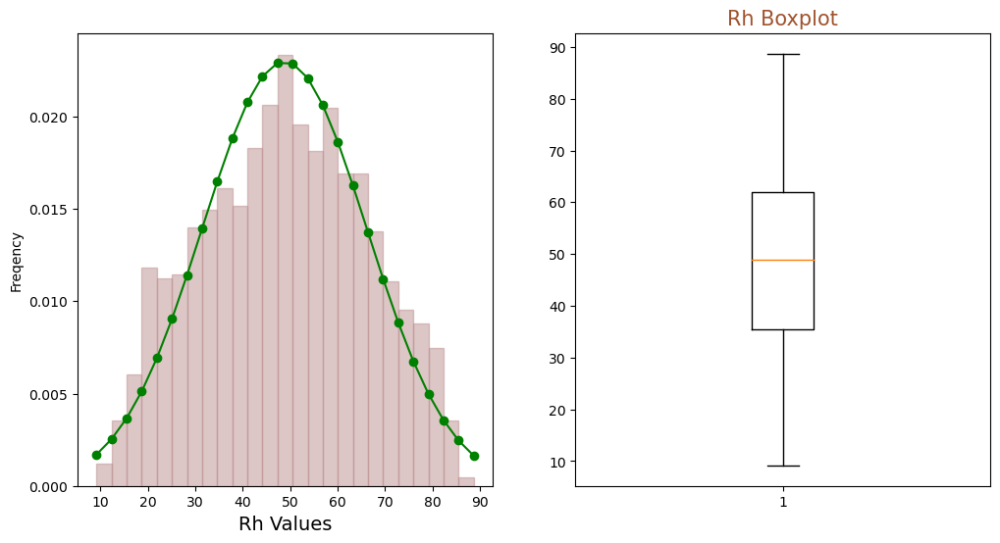

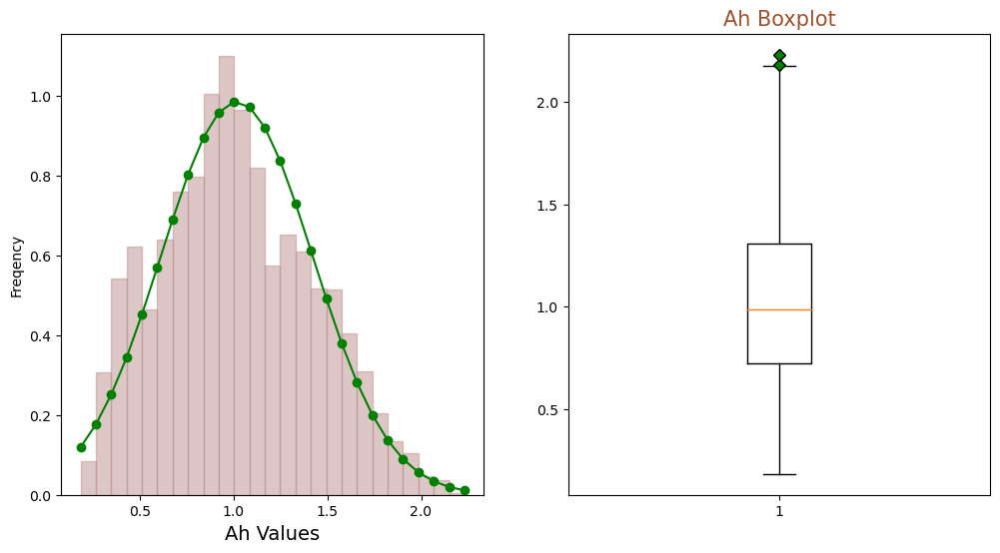

In [ ]:
for column_name in continuous_columns:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

    # Distribution Num. Feature
    _, bins, _ = ax1.hist(data[column_name], bins = 25,
                          density = 1, alpha = 0.5,
                          color = 'rosybrown',
                          ec= 'rosybrown' )

    mu, sigma = stats.norm.fit(data[column_name])
    best_fit_line = stats.norm.pdf(bins, mu, sigma)

    ax1.plot(bins, best_fit_line, 'g-o')

    ax1.set_ylabel('Freqency')
    ax1.set_xlabel(column_name.capitalize() + " Values",fontsize=14)

    # Boxplot
    green_diamond = dict(markerfacecolor='g', marker='D')
    ax2.boxplot(data[column_name],flierprops=green_diamond)

    ax2.set_title(column_name.capitalize() + " Boxplot",
                  fontdict=dict(
                  family="DejaVu Sans",
                  size=15,
                  color="sienna"))
    plt.show()

From graphs it is obvious that there are some untipical values for some features. The strategy is changing values with 95 - percentile.

In [ ]:
def outliers_modification(data, column):
    for i in range(len(data)):
        if data[column][i] > np.percentile(data[column].unique(), 95):
            data[column][i] = np.percentile(data[column].unique(), 95)
    return data
for column in ["PT08.S3(NOx)", "PT08.S1(CO)", "PT08.S2(NMHC)", "NOx(GT)","NO2(GT)"]:
    data = outliers_modification(data, column)

#### Checking correlation between features

In [ ]:
data.corr()

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
CO(GT),1.000000,0.759509,0.779056,0.765380,0.785794,-0.630967,0.694130,0.512400,0.736974,0.001526,0.041948,0.023283
PT08.S1(CO),0.759509,1.000000,0.883679,0.896251,0.644882,-0.792913,0.583043,0.674857,0.901956,0.037572,0.120104,0.122174
C6H6(GT),0.779056,0.883679,1.000000,0.977425,0.636312,-0.750544,0.538868,0.756269,0.861661,0.189659,-0.054986,0.155781
PT08.S2(NMHC),0.765380,0.896251,0.977425,1.000000,0.624823,-0.812822,0.568610,0.769043,0.876467,0.233509,-0.084590,0.174879
NOx(GT),0.785794,0.644882,0.636312,0.624823,1.000000,-0.624111,0.766274,0.192412,0.710846,-0.245725,0.185400,-0.143334
PT08.S3(NOx),-0.630967,-0.792913,-0.750544,-0.812822,-0.624111,1.000000,-0.602341,-0.540859,-0.809079,-0.131750,-0.062207,-0.217022
NO2(GT),0.694130,0.583043,0.538868,0.568610,0.766274,-0.602341,1.000000,0.107970,0.635022,-0.194143,-0.098750,-0.338934
PT08.S4(NO2),0.512400,0.674857,0.756269,0.769043,0.192412,-0.540859,0.107970,1.000000,0.579208,0.558193,-0.014949,0.630315
PT08.S5(O3),0.736974,0.901956,0.861661,0.876467,0.710846,-0.809079,0.635022,0.579208,1.000000,-0.044889,0.137903,0.055548
T,0.001526,0.037572,0.189659,0.233509,-0.245725,-0.131750,-0.194143,0.558193,-0.044889,1.000000,-0.570859,0.654508


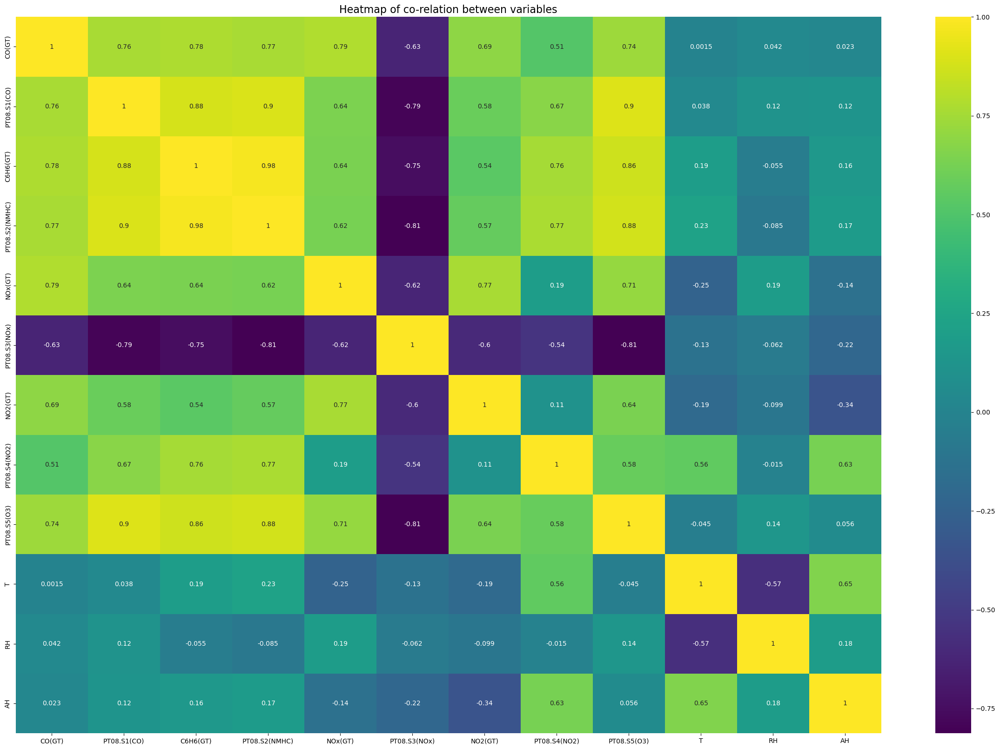

In [ ]:
corrmat=data.corr()
top_corr_feature=corrmat.index
plt.figure(figsize=(30, 20))
plt.title('Heatmap of co-relation between variables',fontsize=16)
graph=sns.heatmap(data[top_corr_feature].corr(), annot=True, cmap='viridis')

From this graph, it can be seen that our target feature C6H6(GT) is highly correlated with the feature PT08.S2(NMHC), but also there is high correlation with PT08.S1(CO)...

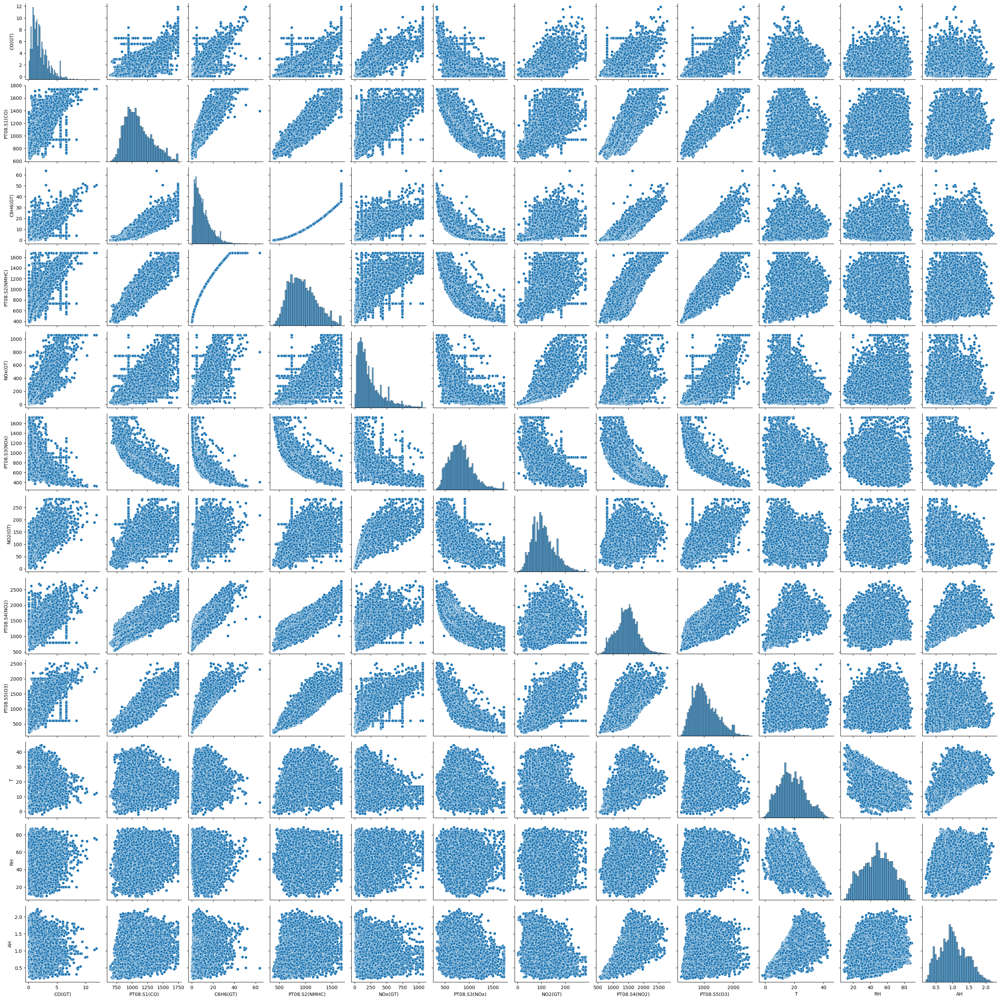

In [ ]:
sns.pairplot(data)

Plot pairwise relationships in a dataset, and we can see again correlations between our features, which features are high correlated and which are not. On next plot, we can see regplot for features C6H6(GT) and PT08.S2(NMHC)

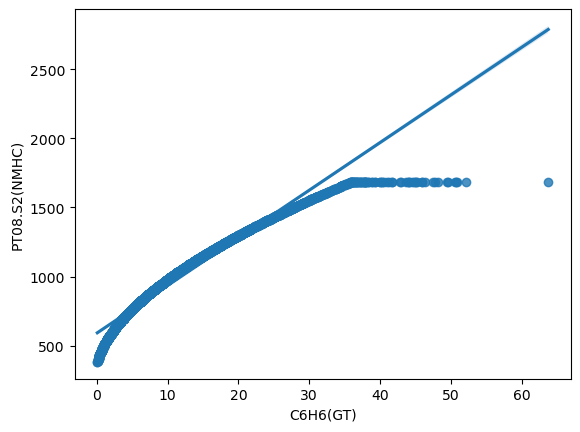

In [ ]:
ax=sns.regplot(x = 'C6H6(GT)', y = 'PT08.S2(NMHC)', data=data)

### Splitting and scaling data

Creating X - all columns except target column and column `Time`

In [ ]:
X = data
X = X.drop('C6H6(GT)', axis=1)
X = X.drop('Time', axis=1)

Creating Y - target column `C6H6(GT)`

In [ ]:
Y=data['C6H6(GT)']
Y.head()

0    11.9
1     9.4
2     9.0
3     9.2
4     6.5
Name: C6H6(GT), dtype: float64

Splitting into test and train set in the ratio of 20:80

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=.2, random_state=42)

It is necessary to scale data.

In [ ]:
sc=StandardScaler()
x_train=sc.fit_transform(x_train)
x_test=sc.transform(x_test)

### Modeling

In [ ]:
from keras.models import Sequential
from keras.layers import Dense
from sklearn.metrics import mean_squared_error

Now I will create a neural network model using the keras Sequential to predict data, based on the input features. Following code creates neural network model with one hidden layer consisting of 128 neurons with ReLU activation function, and an output layer with one unit for regression.

In [ ]:
model = Sequential()
model.add(Dense(128, input_dim=x_train.shape[1], activation='relu'))  # 128 units in hidden layer
model.add(Dense(1))  # output layer with 1 unit

The neural network model is compiled using the compile method of the Keras Sequential API. The compile method configures the model for training by specifying the optimizer and loss function to be used during training. Parameters will be used during training to minimize the loss function and improve the model's predictions.

In [ ]:
model.compile(loss='mean_squared_error', optimizer='adam')

In [ ]:
# Train the model on the training data
history = model.fit(x_train, y_train, validation_data=(x_test, y_test), epochs=50, batch_size=16, verbose=2)

Epoch 1/50
468/468 - 2s - loss: 31.6630 - val_loss: 3.5658 - 2s/epoch - 4ms/step
Epoch 2/50
468/468 - 1s - loss: 2.3381 - val_loss: 1.5370 - 1s/epoch - 2ms/step
Epoch 3/50
468/468 - 1s - loss: 1.1661 - val_loss: 1.0406 - 997ms/epoch - 2ms/step
Epoch 4/50
468/468 - 1s - loss: 0.7851 - val_loss: 0.7797 - 982ms/epoch - 2ms/step
Epoch 5/50
468/468 - 1s - loss: 0.5918 - val_loss: 0.5992 - 994ms/epoch - 2ms/step
Epoch 6/50
468/468 - 1s - loss: 0.4906 - val_loss: 0.5347 - 1s/epoch - 2ms/step
Epoch 7/50
468/468 - 1s - loss: 0.4363 - val_loss: 0.4985 - 982ms/epoch - 2ms/step
Epoch 8/50
468/468 - 1s - loss: 0.3939 - val_loss: 0.6239 - 995ms/epoch - 2ms/step
Epoch 9/50
468/468 - 1s - loss: 0.3749 - val_loss: 0.4635 - 980ms/epoch - 2ms/step
Epoch 10/50
468/468 - 1s - loss: 0.3544 - val_loss: 0.4690 - 991ms/epoch - 2ms/step
Epoch 11/50
468/468 - 1s - loss: 0.3432 - val_loss: 0.3925 - 987ms/epoch - 2ms/step
Epoch 12/50
468/468 - 1s - loss: 0.3296 - val_loss: 0.3725 - 980ms/epoch - 2ms/step
Epoch 13/

In [ ]:
# Evaluate the model
loss = model.evaluate(x_test, y_test)
print('Test loss:', loss)

59/59 [==============================] - 0s 2ms/step - loss: 0.2007
Test loss: 0.20071952044963837


### Visualization

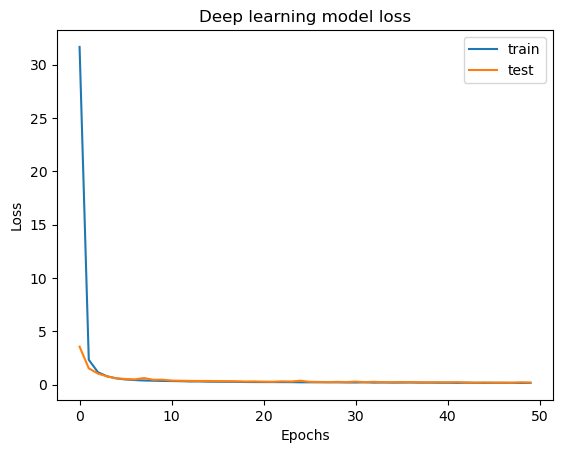

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.title('Deep learning model loss')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['train', 'test'], loc='upper right')

plt.show()

I can see that the lines representing the training and validation loss are close together on the plot. It can indicate that the model is not overfitting or underfitting the data. It suggests that the model is able to generalize well to new, unseen data, and that the training and validation sets are similarly distributed.

In [ ]:
# Evaluate the model on the testing data
y_pred = model.predict(x_test)
mse = mean_squared_error(y_test, y_pred)
print("MSE:", mse)

59/59 [==============================] - 0s 2ms/step
MSE: 0.20071953953169236


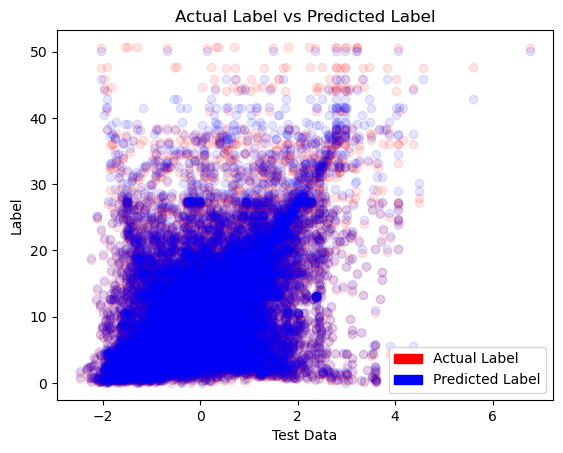

In [ ]:
#Plotting predictions with actual labels
import matplotlib.patches as mpatches

#Creating legend patches
actual = mpatches.Patch(color='red', label='Actual Label')
predicted_label = mpatches.Patch(color='blue', label='Predicted Label')
#Plotting
plt.plot(x_test, y_test, 'o', color='red', alpha=.1)
plt.plot(x_test, y_pred, 'o', color='blue', alpha=.1)
plt.title('Actual Label vs Predicted Label')
plt.xlabel('Test Data')
plt.ylabel('Label')
plt.legend(handles=[actual, predicted_label])

## Results comparison

In Homework_4Mod I solved this task using traditional regression alghoritms and I got:

- MSE: 2.2636796091956017
- accuracy: 0.96

What I can observe is that the approach to solving this problem using a neural network has proven to be significantly better (MSE is significantly lower).

<div class="alert-success">
<h2 style="padding:50px"> Classification task </h2>
</div>

In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from sklearn.metrics import confusion_matrix, f1_score, precision_score, recall_score

### Data loading

In [ ]:
#reading data
data = pd.read_csv("dataset_57_hypothyroid.csv")

In [ ]:
data.head()

,age,sex,on_thyroxine,query_on_thyroxine,on_antithyroid_medication,sick,pregnant,thyroid_surgery,I131_treatment,query_hypothyroid,...,TT4_measured,TT4,T4U_measured,T4U,FTI_measured,FTI,TBG_measured,TBG,referral_source,Class
0,41,F,f,f,f,f,f,f,f,f,...,t,125,t,1.14,t,109,f,?,SVHC,negative
1,23,F,f,f,f,f,f,f,f,f,...,t,102,f,?,f,?,f,?,other,negative
2,46,M,f,f,f,f,f,f,f,f,...,t,109,t,0.91,t,120,f,?,other,negative
3,70,F,t,f,f,f,f,f,f,f,...,t,175,f,?,f,?,f,?,other,negative
4,70,F,f,f,f,f,f,f,f,f,...,t,61,t,0.87,t,70,f,?,SVI,negative


### Data processing

Then, I decided to throw out some columns that I think that won't be useful in the future steps.

In [ ]:
data.drop(['TT4_measured','T4U_measured','FTI_measured','TBG_measured', 'TSH_measured', 'T3_measured', 'referral_source'],axis=1,inplace=True)

In [ ]:
data.shape

(3772, 23)

From here, I can see that our dataset has 3772 rows and 23 columns. From dataset, I can see that some columns has "?" value - missing value, so in next step I will replace it to NAN value and drop duplicates.

In [ ]:
data=data.replace('?', np.nan)

In [ ]:
data.drop_duplicates(keep = False, inplace = True)

#### Missing values handling and features encoding

Next, I will see if the dataset has missing values and in which columns.

In [ ]:
data.isnull().sum()

age                             1
sex                           148
on_thyroxine                    0
query_on_thyroxine              0
on_antithyroid_medication       0
sick                            0
pregnant                        0
thyroid_surgery                 0
I131_treatment                  0
query_hypothyroid               0
query_hyperthyroid              0
lithium                         0
goitre                          0
tumor                           0
hypopituitary                   0
psych                           0
TSH                           277
T3                            677
TT4                           139
T4U                           295
FTI                           293
TBG                          3678
Class                           0
dtype: int64

In [ ]:
data.shape

(3678, 23)

Since the column "TBG" has many missing values, I decided to delete it.

In [ ]:
del data["TBG"]

In [ ]:
data.describe().T

,count,unique,top,freq
age,3677,93,59,95
sex,3530,2,F,2396
on_thyroxine,3678,2,f,3214
query_on_thyroxine,3678,2,f,3628
on_antithyroid_medication,3678,2,f,3637
sick,3678,2,f,3531
pregnant,3678,2,f,3625
thyroid_surgery,3678,2,f,3625
I131_treatment,3678,2,f,3619
query_hypothyroid,3678,2,f,3444


I will then use the Label Encoder to encode the values of the categorical variables.

In [ ]:
data['sex'] = LabelEncoder().fit_transform(data.sex)
data['I131_treatment'] = LabelEncoder().fit_transform(data['I131_treatment'])
data['sick'] = LabelEncoder().fit_transform(data.sick)
data['pregnant'] = LabelEncoder().fit_transform(data.pregnant)
data['thyroid_surgery'] = LabelEncoder().fit_transform(data['thyroid_surgery'])
data['lithium'] = LabelEncoder().fit_transform(data['lithium'])
data['goitre'] = LabelEncoder().fit_transform(data['goitre'])
data['tumor'] = LabelEncoder().fit_transform(data['tumor'])
data['on_thyroxine'] = LabelEncoder().fit_transform(data['on_thyroxine'])
data['query_on_thyroxine'] = LabelEncoder().fit_transform(data['query_on_thyroxine'])
data['on_antithyroid_medication'] = LabelEncoder().fit_transform(data['on_antithyroid_medication'])
data['query_hyperthyroid'] = LabelEncoder().fit_transform(data['query_hyperthyroid'])
data['query_hypothyroid'] = LabelEncoder().fit_transform(data['query_hypothyroid'])
data['hypopituitary'] = LabelEncoder().fit_transform(data['hypopituitary'])
data['psych'] = LabelEncoder().fit_transform(data.psych)

In [ ]:
data.head()

,age,sex,on_thyroxine,query_on_thyroxine,on_antithyroid_medication,sick,pregnant,thyroid_surgery,I131_treatment,query_hypothyroid,...,goitre,tumor,hypopituitary,psych,TSH,T3,TT4,T4U,FTI,Class
0,41,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1.3,2.5,125,1.14,109,negative
1,23,0,0,0,0,0,0,0,0,0,...,0,0,0,0,4.1,2,102,NaN,NaN,negative
2,46,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0.98,NaN,109,0.91,120,negative
3,70,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0.16,1.9,175,NaN,NaN,negative
4,70,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0.72,1.2,61,0.87,70,negative


In [ ]:
data["Class"].value_counts()

negative                   3387
compensated_hypothyroid     194
primary_hypothyroid          95
secondary_hypothyroid         2
Name: Class, dtype: int64

Next, I will encode the Class column so that the value 0 represents a negative class and 1 represents that it is positive, i.e. that it has some type of problem (compensated_hypothyroid, primary_hypothyroid or secondary_hypothyroid).

In [ ]:
data=data.replace({"negative":1,"compensated_hypothyroid":0, "primary_hypothyroid":0, "secondary_hypothyroid":0 })

In [ ]:
data["Class"].value_counts()

1    3387
0     291
Name: Class, dtype: int64

Converting from object to numeric because this shape of data is neccessary for modeling.

In [ ]:
cols = data.columns[data.dtypes.eq('object')]
data[cols] = data[cols].apply(pd.to_numeric, errors='coerce')
data.dtypes

age                          float64
sex                            int32
on_thyroxine                   int32
query_on_thyroxine             int32
on_antithyroid_medication      int32
sick                           int32
pregnant                       int32
thyroid_surgery                int32
I131_treatment                 int32
query_hypothyroid              int32
query_hyperthyroid             int32
lithium                        int32
goitre                         int32
tumor                          int32
hypopituitary                  int32
psych                          int32
TSH                          float64
T3                           float64
TT4                          float64
T4U                          float64
FTI                          float64
Class                          int64
dtype: object

In [ ]:
#checking missing values
data.isnull().sum()

age                            1
sex                            0
on_thyroxine                   0
query_on_thyroxine             0
on_antithyroid_medication      0
sick                           0
pregnant                       0
thyroid_surgery                0
I131_treatment                 0
query_hypothyroid              0
query_hyperthyroid             0
lithium                        0
goitre                         0
tumor                          0
hypopituitary                  0
psych                          0
TSH                          277
T3                           677
TT4                          139
T4U                          295
FTI                          293
Class                          0
dtype: int64

I decided to fill the missing values with the median of each column and drop the remaining missing values.

In [ ]:
miss_cols = ['FTI','TSH','T3','TT4','T4U']
for i in miss_cols:
    data[i] = data[i].fillna(data[i].median())

In [ ]:
data.dropna(inplace=True)

#### Outliers handling

In [ ]:
data.describe()

,age,sex,on_thyroxine,query_on_thyroxine,on_antithyroid_medication,sick,pregnant,thyroid_surgery,I131_treatment,query_hypothyroid,...,goitre,tumor,hypopituitary,psych,TSH,T3,TT4,T4U,FTI,Class
count,3677.000000,3677.000000,3677.000000,3677.000000,3677.000000,3677.000000,3677.000000,3677.000000,3677.000000,3677.000000,...,3677.000000,3677.000000,3677.000000,3677.000000,3677.000000,3677.000000,3677.000000,3677.000000,3677.000000,3677.000000
mean,51.915148,0.388904,0.125918,0.013598,0.011150,0.039978,0.014414,0.014414,0.015774,0.063639,...,0.009247,0.026108,0.000272,0.050041,4.812202,2.011161,108.132662,0.993825,110.203889,0.920859
std,20.145199,0.564132,0.331802,0.115831,0.105019,0.195935,0.119206,0.119206,0.124616,0.244142,...,0.095727,0.159479,0.016491,0.218059,23.609728,0.747712,34.945568,0.187554,31.754224,0.269995
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.005000,0.050000,2.000000,0.250000,2.000000,0.000000
25%,36.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.570000,1.700000,88.000000,0.890000,94.000000,1.000000
50%,54.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,1.400000,2.000000,103.000000,0.980000,107.000000,1.000000
75%,67.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,2.500000,2.300000,123.000000,1.070000,122.000000,1.000000
max,455.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,530.000000,10.600000,430.000000,2.320000,395.000000,1.000000


When I compare the mean and median using this table, I don't see that any attribute has any huge outliers. But, we will see better using next graphs. First I will split continuous columns.

Now, I create a list of continuous columns with idea to check for their outliers later.

In [ ]:
continuous_columns = []
for column_name in data.columns:
    if data[column_name].dtype == float:
        continuous_columns.append(column_name)

In [ ]:
continuous_columns

['age', 'TSH', 'T3', 'TT4', 'T4U', 'FTI']

In [ ]:
df = pd.DataFrame(data, columns=continuous_columns)

<AxesSubplot:>

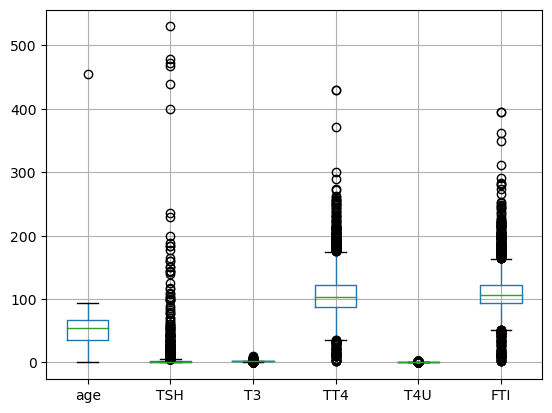

In [ ]:
df.boxplot()

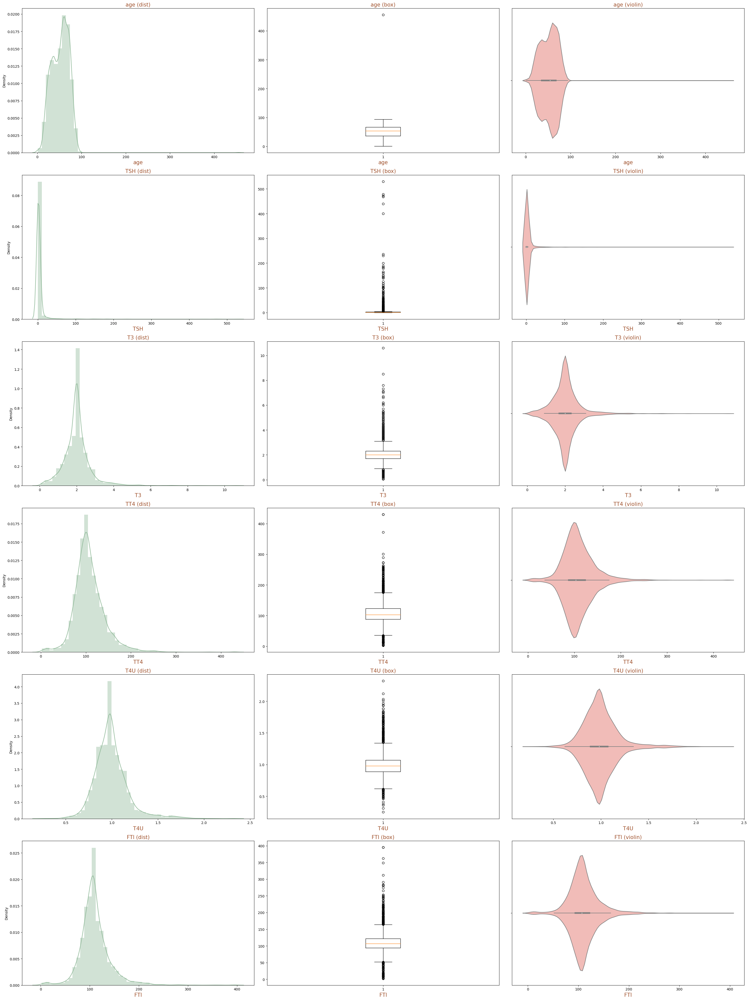

In [ ]:
#  plot numerical data to detect if there are some outliers
a = len(continuous_columns)  # number of rows
b = 3  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(30,40))

for i in continuous_columns:
    plt.subplot(a, b,c)
    plt.title('{} (dist)'.format(i, a, b, c),
                  family="DejaVu Sans",
                  size=15,
                  color="sienna")
    plt.xlabel(i,
              family="DejaVu Sans",
                  size=15,
                  color="sienna")
    sns.distplot(data[i], color = '#8EB897')
    c = c + 1

    plt.subplot(a, b, c)
    plt.title('{} (box)'.format(i, a, b, c),
                  family="DejaVu Sans",
                  size=15,
                  color="sienna")
    plt.xlabel(i,
              family="DejaVu Sans",
                  size=15,
                  color="sienna")
    plt.boxplot(x = data[i])
    c = c + 1

    plt.subplot(a, b, c)
    plt.title('{} (violin)'.format(i, a, b, c),
                  family="DejaVu Sans",
                  size=15,
                  color="sienna")
    plt.xlabel(i,family="DejaVu Sans",
                  size=15,
                  color="sienna")
    sns.violinplot(x = data[i], palette="Pastel1")
    c = c + 1
sns.color_palette("ch:s=.25,rot=-.25", as_cmap=True)
plt.tight_layout()
plt.show()

From graphs it is obvious that there are some untipical values for some features. The strategy is changing values with 95 - percentile.

In [ ]:
def outliers_modification(data, column):
    for i in range(len(data)):
        if data[column][i] > np.percentile(data[column].unique(), 95):
            data[column][i] = np.percentile(data[column].unique(), 95)
    return data

#### Exploring target column

Now, I'll explore the target column a little better.

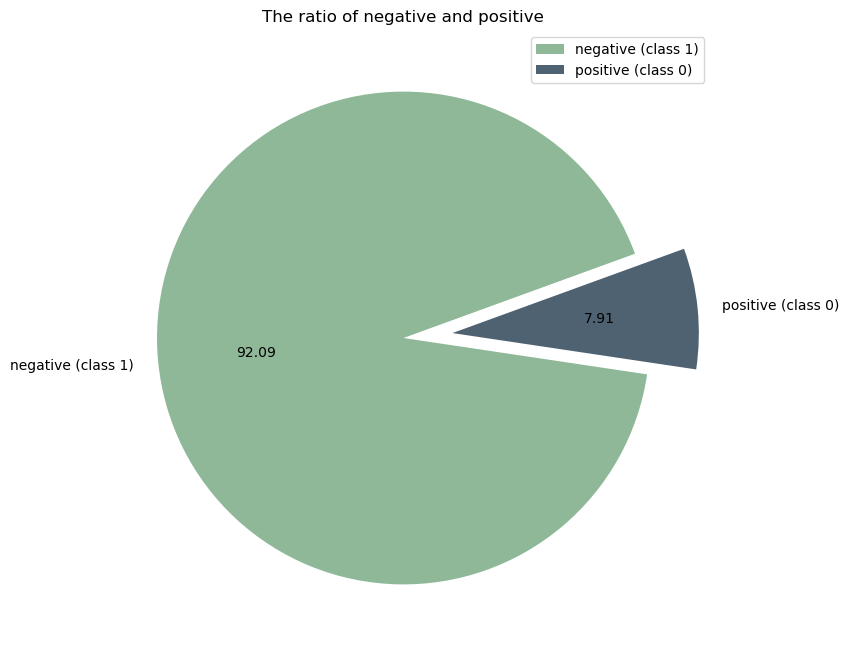

In [ ]:
plt.figure(figsize=(8,8))
plt.pie(x=data.Class.value_counts(),
        labels=['negative (class 1)','positive (class 0)'],
        startangle = 20,
        colors=['#8EB897','#4F6272'],
        autopct='%.2f',
        explode=[0,0.2]
       );
plt.title('The ratio of negative and positive')
plt.legend();
plt.show()

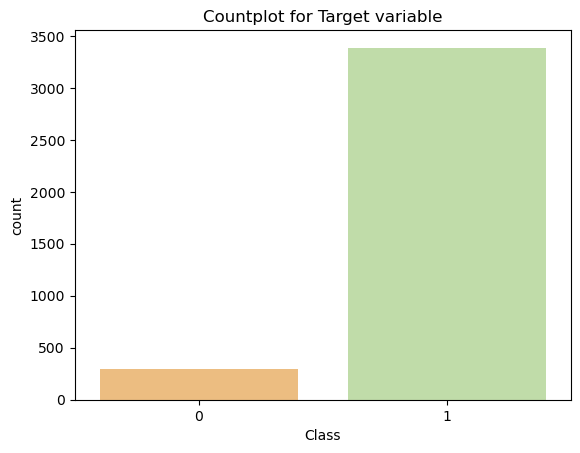

In [ ]:
sns.countplot(x='Class',data=data, palette="Spectral")
plt.title("Countplot for Target variable");
plt.show()

From here I can see that there are many more examples belonging to class 1 than class 0.

I will create table with examples such that they belong to class 0 - positive_df.

In [ ]:
positive_df = data[data.Class==0]

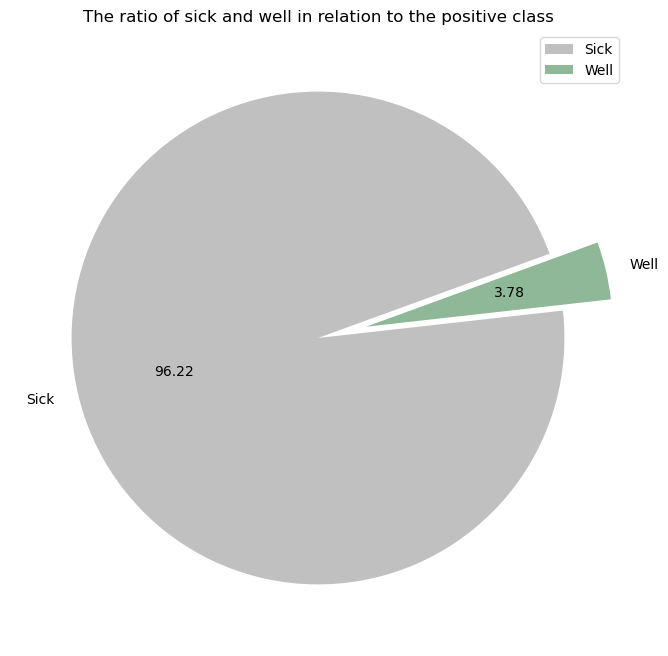

In [ ]:
plt.figure(figsize=(8,8))
plt.pie(x=positive_df.sick.value_counts(),
        labels=['Sick', 'Well'],
        startangle = 20,
        colors=['silver', '#8EB897'],
        autopct='%.2f',
        explode=[0,0.2]
       );
plt.title('The ratio of sick and well in relation to the positive class')
plt.legend();
plt.show()

### Correlation matrix

Correlation between all features of our dataset:

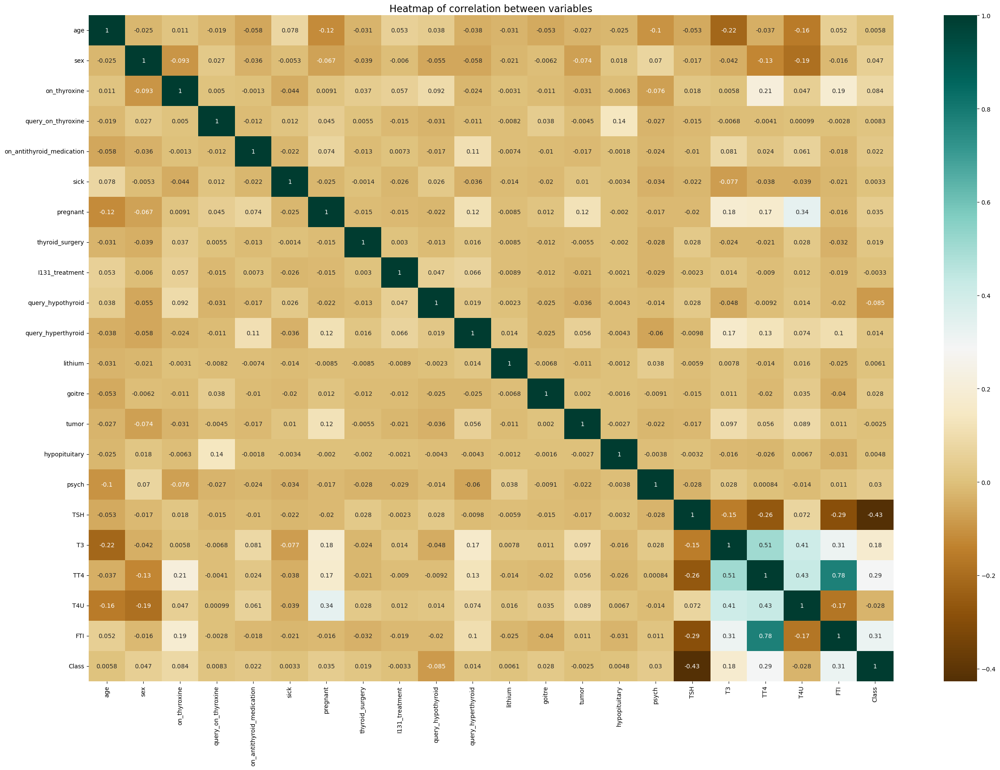

In [ ]:
corrmat=data.corr()
top_corr_feature=corrmat.index
plt.figure(figsize=(30, 20))
plt.title('Heatmap of correlation between variables',fontsize=16)
graph=sns.heatmap(data[top_corr_feature].corr(), annot=True, cmap='BrBG')
plt.show()

From here we can see that there is not a very strong correlation between our target column and the other features.

### Splitting and scaling data

Creating X - all columns except target column.
Creating Y - target column `Class`

In [ ]:
X = data.drop('Class',axis=1)
y = data.Class

Splitting into test and train set in the ratio of 20:80.

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=11)

I will use Synthetic Minority Oversampling Technique (SMOTE), a statistical technique for increasing the number of cases in our dataset in a balanced way. The component works by generating new instances from existing minority cases.

In [ ]:
smote = SMOTE(random_state=11)
x_smote, y_smote = smote.fit_resample(X_train, y_train)

In [ ]:
print("Shape before the oversampling : ", X_train.shape)
print("Shape after the oversampling : ", x_smote.shape)

Shape before the oversampling :  (2941, 21)
Shape after the oversampling :  (5420, 21)


It is necessary to scale data. I choose the MinMaxScaler.

In [ ]:
scalr = StandardScaler()
x_smote.TT4 = scalr.fit_transform(x_smote[['TT4']])
x_smote.age = scalr.fit_transform(x_smote[['age']])
x_smote.FTI = scalr.fit_transform(x_smote[['FTI']])

In [ ]:
X_test.TT4 = scalr.fit_transform(X_test[['TT4']])
X_test.age = scalr.fit_transform(X_test[['age']])
X_test.FTI = scalr.fit_transform(X_test[['FTI']])

### Modeling

Now I will define a neural network model for current task. This neural network model has one hidden layer with 10 units and one output layer with 1 unit, and it uses the ReLU activation function for the hidden layer and the Sigmoid activation function for the output layer. The weights of the layers are initialized using a uniform distribution.

In [ ]:
model = Sequential()
model.add(Dense(10, input_dim=X.shape[1], kernel_initializer='uniform', activation='relu'))  # 10 units in hidden layer
model.add(Dense(1, kernel_initializer='uniform', activation='sigmoid'))  # output layer with 1 unit

I will now compile the model using the binary cross-entropy loss function and the Adam optimizer. This is appropriate because it is a binary classification problem where the target variable has only two classes.

In [ ]:
model.compile(loss='binary_crossentropy', optimizer='adam')

In [ ]:
# Train the model on the training data
history = model.fit(x_smote, y_smote, epochs=50, validation_split=0.2, batch_size=40, verbose=2)

Epoch 1/50
109/109 - 1s - loss: 0.5926 - val_loss: 0.3396 - 1s/epoch - 12ms/step
Epoch 2/50
109/109 - 0s - loss: 0.3686 - val_loss: 0.2357 - 299ms/epoch - 3ms/step
Epoch 3/50
109/109 - 0s - loss: 0.2275 - val_loss: 0.1977 - 297ms/epoch - 3ms/step
Epoch 4/50
109/109 - 0s - loss: 0.1773 - val_loss: 0.1418 - 286ms/epoch - 3ms/step
Epoch 5/50
109/109 - 0s - loss: 0.1548 - val_loss: 0.1347 - 283ms/epoch - 3ms/step
Epoch 6/50
109/109 - 0s - loss: 0.1421 - val_loss: 0.1161 - 300ms/epoch - 3ms/step
Epoch 7/50
109/109 - 0s - loss: 0.1333 - val_loss: 0.1003 - 285ms/epoch - 3ms/step
Epoch 8/50
109/109 - 0s - loss: 0.1265 - val_loss: 0.1024 - 283ms/epoch - 3ms/step
Epoch 9/50
109/109 - 0s - loss: 0.1210 - val_loss: 0.1087 - 284ms/epoch - 3ms/step
Epoch 10/50
109/109 - 0s - loss: 0.1157 - val_loss: 0.0983 - 284ms/epoch - 3ms/step
Epoch 11/50
109/109 - 0s - loss: 0.1111 - val_loss: 0.1001 - 285ms/epoch - 3ms/step
Epoch 12/50
109/109 - 0s - loss: 0.1069 - val_loss: 0.0985 - 282ms/epoch - 3ms/step
Epo

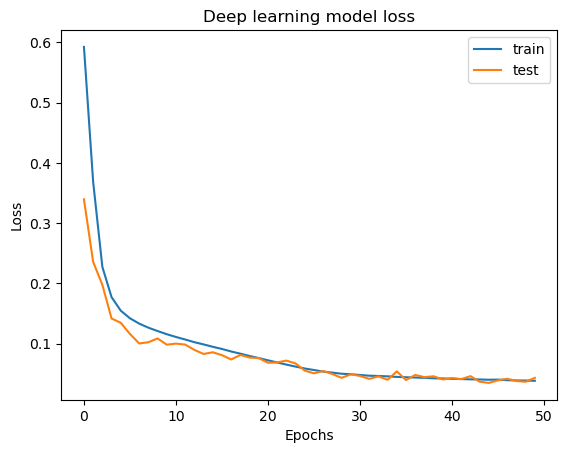

In [ ]:
# summarize the result and plot the training and test loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

# Set the parameters
plt.title('Deep learning model loss')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['train', 'test'], loc='upper right')

# Display the plots
plt.show()

As it was case in first task, I can see that the lines representing the training and validation loss are close together on the plot. It can indicate that the model is not overfitting or underfitting the data. It suggests that the model is able to generalize well to new, unseen data, and that the training and validation sets are similarly distributed.

In [ ]:
# Evaluate the model using ROC AUC
y_pred = model.predict(X_test).round()

roc_auc = roc_auc_score(y_test, y_pred)
print('ROC AUC:', roc_auc)

23/23 [==============================] - 0s 2ms/step
ROC AUC: 0.9759368836291913


In [ ]:
# Calculating the F1 score, recall, and precision
print("%s: %.2f%%" % ("F1-score", f1_score(y_test, y_pred)*100))
print("%s: %.2f%%" % ("Recall", recall_score(y_test, y_pred)*100))
print("%s: %.2f%%" % ("Precision", precision_score(y_test, y_pred)*100))

F1-score: 99.11%
Recall: 98.52%
Precision: 99.70%


The metrics provided seem to indicate that the model has performed very well on the test set.

## Results comparison

In Homework_5Mod I solved this task using traditional alghoritms for classification and I got:

- ROC AUC (Logistic regression): 0.9151873767258382
- ROC AUC (KNN): 0.992603550295858

What I can observe is that the approach to solving this problem using a neural network has proven to be good, but that traditional approaches are also proving to be competitive and in some cases even better and cheaper than neural networks.

<div class="alert-success">
<h2 style="padding:50px"> CV task </h2>
</div>

In [ ]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras

#### Data loading

In [ ]:
base_dir = 'hotdog__not_hotdog'

In [ ]:
train_path = os.path.join(base_dir, 'train')

In [ ]:
image_size = (256, 256)

`image_dataset_from_directory` is a method provided by the Keras deep learning library that allows me to create a dataset of labeled images for training and validation.

In [ ]:
training_ds = keras.utils.image_dataset_from_directory(train_path,
                                                      validation_split=0.3,
                                                      subset="training",
                                                      seed=99,
                                                      image_size=image_size)

Found 498 files belonging to 2 classes.
Using 349 files for training.


In [ ]:
validation_ds = keras.utils.image_dataset_from_directory(train_path,
                                                        validation_split=0.3,
                                                        subset="validation",
                                                        seed=99,
                                                        image_size=image_size)

Found 498 files belonging to 2 classes.
Using 149 files for validation.


Data visualization:

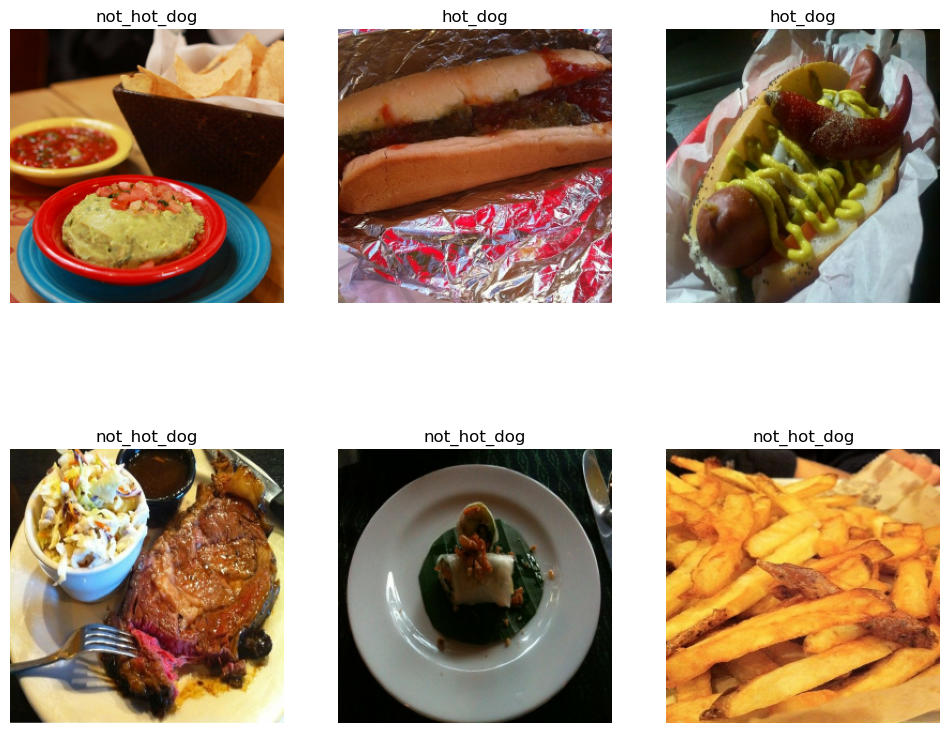

In [ ]:
plt.figure(figsize=(12, 10))
for images, labels in training_ds.take(1):
    for i in range(6):
        ax = plt.subplot(2, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(training_ds.class_names[labels[i]])
        plt.axis("off")

Now, I will normalize the pixel values of the images, and create batches of images and their corresponding labels.

In [ ]:
normalization_layer = keras.layers.Rescaling(1./255)
normalized_ds = training_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))

I will configure the dataset for performance (cache and prefetch the training and validation datasets for faster training by utilizing tensorflow's autotune feature).

In [ ]:
autotune = tf.data.AUTOTUNE
training_ds = training_ds.cache().prefetch(buffer_size=autotune)
validation_ds = validation_ds.cache().prefetch(buffer_size=autotune)

`input_shape` specifies the shape of the input data for a neural network model, and in this case it has dimensions `(image_size, image_size, 3)` to account for the width, height, and color of the input images.

In [ ]:
input_shape = (image_size + (3,))

I will use the ResNet50 model from the Keras library for this task.

In [ ]:
base_model_resnet50 = keras.applications.resnet50.ResNet50(weights='imagenet',
                                                           include_top=False,
                                                           input_shape=input_shape)
base_model_resnet50.trainable = False

In [ ]:
# Model creation
number_of_classes=2

Model initialisation:

In [ ]:
inputs = keras.Input(shape=input_shape, name='image')
settings = keras.applications.resnet50.preprocess_input(inputs)
settings = base_model_resnet50(settings)
settings = keras.layers.Rescaling(1./255)(settings)
settings = keras.layers.GlobalAveragePooling2D()(settings)
settings = keras.layers.Flatten()(settings)
settings = keras.layers.Dense(128, activation='relu')(settings)
settings = keras.layers.Dropout(.3)(settings)
outputs = keras.layers.Dense(number_of_classes)(settings)
model = keras.Model(inputs, outputs, name='resnet50')

I will now compile the model using the Adam optimizer with the Sparse Categorical Cross-Entropy loss function.

In [ ]:
model.compile(optimizer='adam',
              loss=tf.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
# Training data
history = model.fit(training_ds,
                    validation_data=validation_ds,
                    epochs=20)

Epoch 1/20
11/11 [==============================] - 201s 18s/step - loss: 0.6855 - accuracy: 0.7020 - val_loss: 0.6742 - val_accuracy: 0.8725
Epoch 2/20
11/11 [==============================] - 189s 18s/step - loss: 0.6641 - accuracy: 0.8797 - val_loss: 0.6482 - val_accuracy: 0.8792
Epoch 3/20
11/11 [==============================] - 190s 18s/step - loss: 0.6349 - accuracy: 0.8911 - val_loss: 0.6165 - val_accuracy: 0.8859
Epoch 4/20
11/11 [==============================] - 188s 18s/step - loss: 0.6010 - accuracy: 0.9026 - val_loss: 0.5785 - val_accuracy: 0.8859
Epoch 5/20
11/11 [==============================] - 187s 18s/step - loss: 0.5586 - accuracy: 0.8997 - val_loss: 0.5364 - val_accuracy: 0.8993
Epoch 6/20
11/11 [==============================] - 188s 18s/step - loss: 0.5130 - accuracy: 0.8968 - val_loss: 0.4930 - val_accuracy: 0.8993
Epoch 7/20
11/11 [==============================] - 188s 18s/step - loss: 0.4700 - accuracy: 0.9083 - val_loss: 0.4511 - val_accuracy: 0.9060
Epoch 

Similar steps to load test data:

In [ ]:
test_path = os.path.join(base_dir, 'test')

In [ ]:
testing_ds = keras.utils.image_dataset_from_directory(test_path,
                                                      subset=None,
                                                      validation_split=None,
                                                      seed=99,
                                                      image_size=image_size)

Found 500 files belonging to 2 classes.


In [ ]:
model.evaluate(testing_ds)

16/16 [==============================] - 192s 12s/step - loss: 0.2567 - accuracy: 0.9120


[0.2566564679145813, 0.9120000004768372]

As I can see, the model achieved a loss of 0.2567 and an accuracy of 91.2% on the test set. The loss is a measure of how well the model predicts the correct label for each image, while the accuracy represents the proportion of correctly classified images out of all the images in the test set. In my case, metrics values indicate that the model is performing well on the test dataset.

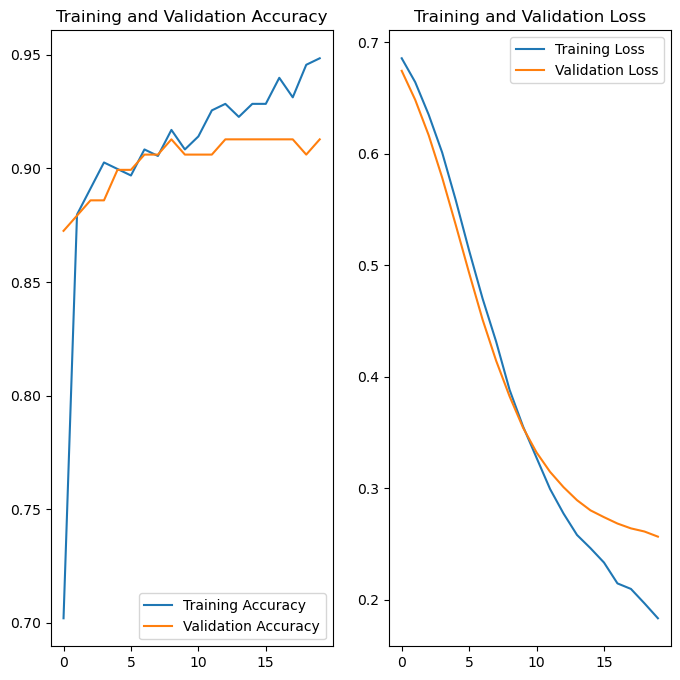

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(20)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()


The model appears to be well trained, in the sense that there is no indication of overfit as can be seen in the comparison of the training and validation graphs.